# Visualizations, Exploration and Analysis of the Composite <em> Health Resources </em> and <em>Heatlh Outcomes</em> Index Dataset

Visualization is a very important part of a data science project. It helps people see, interact with, digest and articulate the contents and complicated concepts easier. It also supports communication and minimizes the potential conflicts among all the interested parties. Visualization has two critical concepts: Expressiveness and Effectiveness.


`Expressiveness`: to what extent the visualization includes essential information.<br>
`Effectiveness:` to what extent the visualization displays essential information clearly.

In this context, we used “the Grammar of Graphics” as a tool that helps to describe the various components of a visualization in a systematic way so that visualizations become more expressive and more effective.
We produced multiple visualizations while considering the Grammar of Graphics for each one through the different sections of the project, from data manipulation to information visualizations as follows:

#### Import Requirements and Dataset

In [1]:
import pandas as pd
import numpy as np
import altair as alt
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import scipy.stats as stats
import scipy.stats
from scipy.stats import f_oneway

In [2]:
# long_all_exp=pd.read_csv('/content/drive/MyDrive/Milestone I/long_all_exp.csv',low_memory=False)
# long_all_health=pd.read_csv('/content/drive/MyDrive/Milestone I/long_all_health.csv',low_memory=False)
# df_wide_all = pd.read_csv('/content/drive/MyDrive/Milestone I/wide_all.csv')

In [3]:
df_wide_all = pd.read_csv("../src/data/wide_all.csv")
long_all_exp = pd.read_csv("../src/data/long_all_exp.csv", low_memory=False)
long_all_health = pd.read_csv("../src/data/long_all_health.csv", low_memory=False)

In [4]:
# select columns to keep for analysis
cols = [
    "country",
    "code",
    "year",
    "hdicode",
    "Region Name",
    "hdi_rank_2021",
    "year_dist_mean",
    "year_dist_mean_exp",
]
cols_renamed = [
    "country",
    "code",
    "year",
    "HDI code",
    "Region Name",
    "hdi_rank_2021",
    "Health Outcomes Index",
    "Health Resources Index",
]
df_select = df_wide_all[cols].round()
df_select.columns = cols_renamed
# convert 'year' column to datetime
df_select["year"] = pd.to_datetime(df_select["year"], format="%Y").dt.year
# df_select.head(2)

#### Aggregate dataset- by mean value over the years
Create df which has one row per country, grouping variables by mean values over select number of years, for each country

In [5]:
def mean_resources_outcomes(df, columns_to_agg, columns_to_groupby, sort_index):
    top_mean_resources = (
        df.groupby(columns_to_groupby)[columns_to_agg]
        .mean()
        .reset_index()
        .sort_values(by=columns_to_agg[sort_index], ascending=True)
        .round()
    )  # .dropna()
    return top_mean_resources


# df_aggregated = mean_resources_outcomes(df_select, [ 'Health Outcomes Index','Health Resources Index'], ['country', 'code', 'HDI code', 'Region Name', 'hdi_rank_2021'], 0)
# df_aggregated.head(25)

In [6]:
# df_10years = df_select[df_select['year'] >= 2010]
# df_5years = df_select[df_select['year'] >= 2015]
# df_aggregated = mean_resources_outcomes(df_10years, [ 'Health Outcomes Index','Health Resources Index'], ['country', 'code', 'HDI code', 'Region Name', 'hdi_rank_2021'], 0)
# df_aggregated.head(25)

#### Continuous to Categorical - Health Outcomes and Health Resources
Create categorical variables for health outcomes index and health resource index - Category and Rank for each country for the latest year

Aggregate dataframe countries by max year, to represent composite indices values for all countries in most recent year

In [7]:
def df_agg_maxyear():
    df_max_year = df_select[df_select["year"] == 2021]
    return df_max_year


df_aggregated = df_agg_maxyear()
# df_aggregated.sort_values(by = ['Health Outcomes Index', 'country']).head(25)
# df_aggregated

Determine quartiles for the Outcomes and Resources composite indices to use later for quantitative to categorical variable conversion (bins for pd.cut)

In [8]:
df_aggregated.describe()

,year,hdi_rank_2021,Health Outcomes Index,Health Resources Index
count,181.0,181.000000,181.000000,181.000000
mean,2021.0,97.082873,88.138122,100.232044
std,0.0,55.631114,49.676819,68.245564
min,2021.0,1.000000,30.000000,13.000000
25%,2021.0,50.000000,54.000000,41.000000
50%,2021.0,97.000000,70.000000,81.000000
75%,2021.0,146.000000,116.000000,151.000000
max,2021.0,191.000000,302.000000,309.000000


Add categorical columns to the  dataframe

In [9]:
pd.options.mode.chained_assignment = None  # default='warn'
df_aggregated = df_agg_maxyear()
# df_aggregated = mean_resources_outcomes(df_select, [ 'Health Outcomes Index','Health Resources Index'], ['country', 'code', 'HDI code', 'Region Name', 'hdi_rank_2021'], 0)
# df_aggregated = mean_resources_outcomes(df_10years, [ 'Health Outcomes Index','Health Resources Index'], ['country', 'code', 'HDI code', 'Region Name', 'hdi_rank_2021'], 0)
# df_aggregated = mean_resources_outcomes(df_5years, [ 'Health Outcomes Index','Health Resources Index'], ['country', 'code', 'HDI code', 'Region Name', 'hdi_rank_2021'], 0)


def compindex_to_categorical(df_aggregated):
    # add a column Health Outcomes Category next to the Health Outcomes Index
    category_outcomes = pd.cut(
        df_aggregated["Health Outcomes Index"],
        bins=[26, 53, 70, 115, 317],
        labels=["Best", "Good", "Fair", "Bad"],
    )  # bins = [28,52, 69, 117,286]
    df_aggregated.insert(8, "Health Outcomes Category", category_outcomes)
    # add a column Health Resources Category next to the Health Resources Index
    category_resources = pd.cut(
        df_aggregated["Health Resources Index"],
        bins=[10, 42, 82, 148, 313],
        labels=["VeryLow", "Low", "Medium", "High"],
    )  #  bins = [16,39, 86, 152,272]
    df_aggregated.insert(8, "Health Resources Category", category_resources)
    return df_aggregated


df_categories = compindex_to_categorical(df_aggregated)
df_select = compindex_to_categorical(df_select)

Add rank columns to the aggregated dataframe

In [10]:
pd.options.mode.chained_assignment = None  # default='warn'


def compindex_to_ranking(df_categories):
    # add a rank column next to the Health Outcomes Index. Low value for Index means higher/better rank (are better than higher)
    df_categories["Health Outcomes Rank"] = df_categories["Health Outcomes Index"].rank(
        ascending=True
    )
    # add a rank column next to the Health Resources Index. High value for Index means higher/better rank (are better than lower)
    df_categories["Health Resources Rank"] = df_categories[
        "Health Resources Index"
    ].rank(ascending=False)
    return df_categories.sort_values(by=["Health Outcomes Rank", "country"])


df = compindex_to_ranking(df_categories)

Merge categories and ranks in the main df with all years (df_select)

In [11]:
def df_allyears_merge_categ_rank(df, df_select):
    df_category_rank = df[["country", "Health Outcomes Rank", "Health Resources Rank"]]
    df_allyears = pd.merge(df_select, df_category_rank, how="left", on="country")
    return df_allyears.sort_values(by=["Health Outcomes Rank", "country"])


df_allyears = df_allyears_merge_categ_rank(df, df_select)
# df_allyears

In [12]:
df.columns

Index(['country', 'code', 'year', 'HDI code', 'Region Name', 'hdi_rank_2021',
       'Health Outcomes Index', 'Health Resources Index',
       'Health Resources Category', 'Health Outcomes Category',
       'Health Outcomes Rank', 'Health Resources Rank'],
      dtype='object')

#### Efficiency Ranking

Create Efficiency Rank for all Countries

In [13]:
def df_countries_efficiency():
    df["Efficiency"] = df["Health Resources Rank"] - df["Health Outcomes Rank"]
    df["Efficiency Rank"] = df["Efficiency"].rank(ascending=False)
    df_efficiency = df[["country", "Efficiency Rank", "Region Name"]].sort_values(
        by="Efficiency Rank", ascending=True
    )
    return df_efficiency


df_efficiency = df_countries_efficiency()
df_efficiency

,country,Efficiency Rank,Region Name
263,Bahrain,1.0,Asia
1803,Jamaica,2.0,Americas
527,Brunei Darussalam,3.0,Asia
2463,Morocco,4.0,Africa
2727,Oman,5.0,Asia
...,...,...,...
3299,South Africa,177.0,Africa
2067,Lesotho,178.5,Africa
2419,Mongolia,178.5,Asia
549,Bulgaria,180.0,Europe


In [14]:
# visualize most and least efficient countries
def create_efficiency_bar(df, most_least):
    bar = (
        alt.Chart(df)
        .mark_rect()
        .encode(
            # x=alt.X('Efficiency Rank'),
            y=alt.Y(
                "country",
                sort=alt.EncodingSortField(
                    field="Efficiency Rank", op="count", order="ascending"
                ),
            ),
            color=alt.Color(
                "Region Name",
                sort=alt.EncodingSortField(
                    field="Efficiency Rank", op="count", order="ascending"
                ),
                scale=alt.Scale(scheme="greenblue"),
            ),
            tooltip="Region Name",
            text="Efficiency Rank",
        )
        .properties(title=most_least + " Efficient Countries")
    )
    return bar


inefficient_bar = create_efficiency_bar(df_efficiency.tail(7), "7 Least")
efficient_bar = create_efficiency_bar(df_efficiency.head(7), "7 Most")

efficient_bar | inefficient_bar

alt.HConcatChart(...)

In [15]:
inefficient_bar = create_efficiency_bar(df_efficiency.tail(91).sort_values(
    by = 'Efficiency Rank', ascending = False ), "Least Efficient")
efficient_bar = create_efficiency_bar(df_efficiency.head(91), "Most Efficient")

efficient_bar | inefficient_bar

alt.HConcatChart(...)

No European country is represented in the top 7 efficient

#### Exploratory Data Analysis

In [16]:
# df_wide_all.head(2)
(
    "The dataset has "
    + str(df_wide_all.shape[0])
    + " rows, and "
    + str(df_wide_all.shape[1])
    + " columns"
)

'The dataset has 3982 rows, and 40 columns'

In [17]:
# df_wide_all.columns

In [18]:
# how many countries
"There are " + str(len(df_wide_all["country"].unique())) + " countries in this dataset"

'There are 181 countries in this dataset'

In [19]:
# select columns to keep for analysis
cols = [
    "country",
    "code",
    "year",
    "hdicode",
    "Region Name",
    "hdi_rank_2021",
    "year_dist_mean",
    "year_dist_mean_exp",
]
cols_renamed = [
    "country",
    "code",
    "year",
    "HDI code",
    "Region Name",
    "hdi_rank_2021",
    "Health Outcomes Index",
    "Health Resources Index",
]
df_select = df_wide_all[cols].round()
df_select.columns = cols_renamed
# convert 'year' column to datetime
df_select["year"] = pd.to_datetime(df_select["year"], format="%Y").dt.year
# df_select.head(2)

##### barcharts
How many countries are represented in each 
- HDI subgroup
- Region

In [20]:
def perc_subgroup_countries_df(df, subgroup):

    perc_subgroup_countries_df = pd.DataFrame(df[subgroup].value_counts()).reset_index()
    perc_subgroup_countries_df.columns = [subgroup, "number of countries"]
    perc_subgroup_countries_df["percent_countries"] = (
        perc_subgroup_countries_df["number of countries"]
        / perc_subgroup_countries_df["number of countries"].sum()
        * 100
    )
    perc_subgroup_countries_df = perc_subgroup_countries_df.round()
    return perc_subgroup_countries_df

In [21]:
df_perc_hdicode = perc_subgroup_countries_df(df, "HDI code")
df_perc_hdicode

,HDI code,number of countries,percent_countries
0,Very High,62,34.0
1,High,45,25.0
2,Medium,42,23.0
3,Low,32,18.0


In [22]:
df_perc_region = perc_subgroup_countries_df(df, "Region Name")
df_perc_region

,Region Name,number of countries,percent_countries
0,Africa,53,29.0
1,Asia,46,25.0
2,Europe,39,22.0
3,Americas,33,18.0
4,Oceania,10,6.0


Now, let's create the visuals for percentage of countries in each hdi subgroup and percent of countries in each region

In [23]:
def create_subgroup_countrypercent_vis(df, subgroup):
    subgroup_perc_vis = (
        alt.Chart(df)
        .mark_rect()
        .encode(
            x=alt.X("percent_countries"),
            y=alt.Y(
                subgroup,
                title=subgroup,
                sort=alt.EncodingSortField(
                    field=subgroup, op="count", order="ascending"
                ),
            ),
            tooltip="percent_countries",
            color=alt.Color(
                subgroup,
                sort=alt.EncodingSortField(
                    field=subgroup, op="count", order="ascending"
                ),
                scale=alt.Scale(scheme="greenblue"),
            ),
        )
        .properties(
            height=100, width=400, title=("Percent of Countries in each " + subgroup)
        )
    )
    return subgroup_perc_vis

In [24]:
vis_hdicode_perc_countries = create_subgroup_countrypercent_vis(
    df_perc_hdicode, "HDI code"
)
vis_region_perc_countries = create_subgroup_countrypercent_vis(
    df_perc_region, "Region Name"
)

hdi_region_perc_vis = vis_hdicode_perc_countries | vis_region_perc_countries
hdi_region_perc_vis

alt.HConcatChart(...)

##### Choropleth map

In [25]:
def create_choro_map(df, column, mrange):
    fig = px.choropleth(
        df,
        title=column + " (2021)",
        locations="code",
        color=(column),
        scope="world",
        hover_data=["country", "HDI code"],
        color_continuous_scale="turbo",  # bluered
        range_color=(0, mrange),
        # animation_frame='year',
        width=1000,
        height=500,
    )
    fig.update_layout(title={"text": column + " (2021)", "x": 0.5, "xanchor": "center"})
    return fig.show()

In [26]:
create_choro_map(df_allyears, "Health Resources Rank", 185),
create_choro_map(df_allyears, "Health Outcomes Rank", 185)

##### Histograms
Create Histograms to visualize distributions of the two composite indices (Health Outcomes and Health Resources)


In [27]:
# making the simple histogram on distribution of the composites indices (Health Resources and Health Outcomes) among the 183 countries
def create_histogram(df, column):
    hist = (
        alt.Chart(df)
        .mark_bar()
        .encode(
            x=alt.X(column, bin=alt.BinParams(maxbins=50)),
            y="count()",
            # color = alt.Color('Region Name'),
            color=alt.Color(
                "HDI code",
                sort=(["Very High", "High", "Medium", "Low"]),
                scale=alt.Scale(scheme="greenblue"),
            ),
            tooltip=[
                "country",
                "Health Outcomes Rank",
                "Health Resources Rank",
                "HDI code",
            ],
        )
    )
    # showing the histogram
    return hist


hist_outcomes = create_histogram(df, "Health Outcomes Index")
hist_resources = create_histogram(df, "Health Resources Index")

hists = (
    (hist_outcomes | hist_resources)
    .properties(title="Health Outcomes Index and Health Resources Index Distributions")
    .configure_axis(labelFontSize=10, titleFontSize=12)
)
hists

alt.HConcatChart(...)

Insights:
- Both Outcomes and Resources are right skewed, with a lot of countries with good outcomes and a lot of countries with low resources. Outcomes are more skewed than resources
- More Developed countries (very high -high HDI) have better (lower) healthcare outcomes
- More Undeveloped countries (low - medium HDI) alot lower healthcare resources

#### Multivarate Analysis & Visualizations

##### Correlation Heatmap
Create a correlation heatmap for to analyze relationship between Health Resources and Health Outcomes and HDI, for all 181 countries, 

In [28]:
corr_cols = [
    "hdi_rank_2021",
    "Health Outcomes Index",
    "Health Resources Index",
    "Health Outcomes Rank",
    "Health Resources Rank",
]

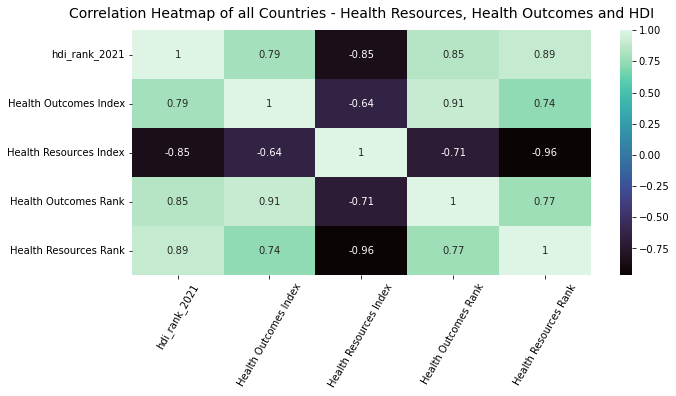

In [29]:
def create_heatmap(data):
    fig = plt.figure(figsize=(10, 6))
    ax = sns.heatmap(data=data.corr(), cmap="mako", annot=True)
    ax.set_title(
        "Correlation Heatmap of all Countries - Health Resources, Health Outcomes and HDI",
        fontsize=14,
        pad=12,
    )
    fig.tight_layout()
    fig.subplots_adjust(top=0.88)
    for ax in fig.axes:
        plt.sca(ax)
        plt.xticks(rotation=60)
    return plt.show()


create_heatmap(df[corr_cols])

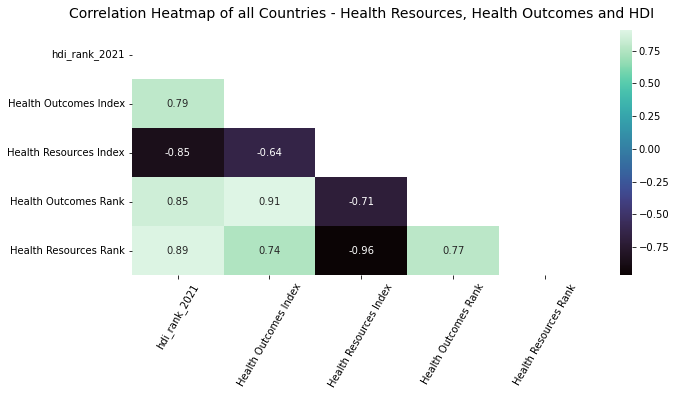

In [30]:
# Diagonal correlation matrix
def create_heatmap(data):
    mask = np.triu(data.corr())
    fig = plt.figure(figsize=(10, 6))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    ax = sns.heatmap(data=data.corr(), mask=mask, cmap="mako", annot=True)
    ax.set_title(
        "Correlation Heatmap of all Countries - Health Resources, Health Outcomes and HDI",
        fontsize=14,
        pad=12,
    )
    fig.tight_layout()
    fig.subplots_adjust(top=0.88)
    for ax in fig.axes:
        plt.sca(ax)
        plt.xticks(rotation=60)
    return plt.show()


create_heatmap(df[corr_cols])

Compute and Visualize correlation for the two variables in each Region (factegrid heatmap)

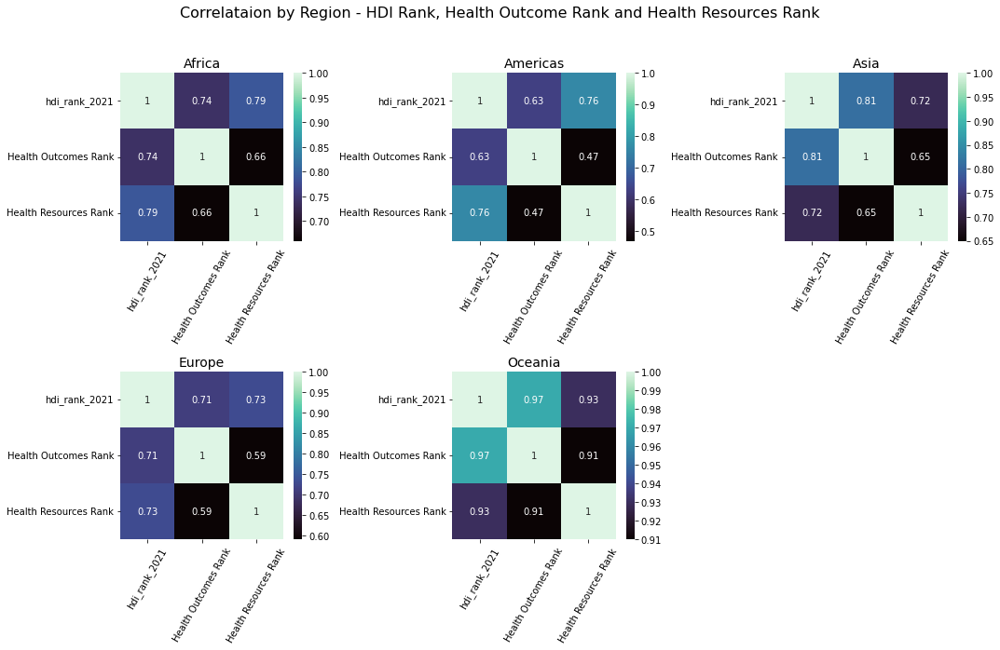

In [31]:
# plot correlation for countries by Region Name
# create separate parl_hdi dfs for each hdicode category
africa_df = df[df["Region Name"] == "Africa"]
americas_df = df[df["Region Name"] == "Americas"]
asia_df = df[df["Region Name"] == "Asia"]
europe_df = df[df["Region Name"] == "Europe"]
oceania_df = df[df["Region Name"] == "Oceania"]

# create separate correlation dfs for each region category
africa_corr = (
    africa_df[["hdi_rank_2021", "Health Outcomes Rank", "Health Resources Rank"]]
    .corr()
    .round(2)
)
americas_corr = (
    americas_df[["hdi_rank_2021", "Health Outcomes Rank", "Health Resources Rank"]]
    .corr()
    .round(2)
)
asia_corr = (
    asia_df[["hdi_rank_2021", "Health Outcomes Rank", "Health Resources Rank"]]
    .corr()
    .round(2)
)
europe_corr = (
    europe_df[["hdi_rank_2021", "Health Outcomes Rank", "Health Resources Rank"]]
    .corr()
    .round(2)
)
oceania_corr = (
    oceania_df[["hdi_rank_2021", "Health Outcomes Rank", "Health Resources Rank"]]
    .corr()
    .round(2)
)

# plot heatmaps for each Region
# Here we create a figure instance, and subplots
fig = plt.figure(figsize=(15, 10))  # width x height
ax1 = fig.add_subplot(2, 3, 1)  # row, column, position
ax2 = fig.add_subplot(2, 3, 2)
ax3 = fig.add_subplot(2, 3, 3)
ax4 = fig.add_subplot(2, 3, 4)
ax5 = fig.add_subplot(2, 3, 5)
fig.suptitle(
    "Correlataion by Region - HDI Rank, Health Outcome Rank and Health Resources Rank",
    fontsize=16,
)
# We use ax parameter to tell seaborn which subplot to use for this plot
sns.heatmap(
    data=africa_corr, ax=ax1, cmap="mako", annot=True
)  # , square=True, cbar_kws={'shrin
ax1.set_title("Africa", fontsize=14)
sns.heatmap(
    data=americas_corr, ax=ax2, cmap="mako", annot=True
)  # , square=True, cbar_kws={'shrink':
ax2.set_title("Americas", fontsize=14)
sns.heatmap(
    data=asia_corr, ax=ax3, cmap="mako", annot=True
)  # , square=True, cbar_kws={'shrink': .
ax3.set_title("Asia", fontsize=14)
sns.heatmap(
    data=europe_corr, ax=ax4, cmap="mako", annot=True
)  # , square=True, cbar_kws={'shrink': .
ax4.set_title("Europe", fontsize=14)
sns.heatmap(
    data=oceania_corr, ax=ax5, cmap="mako", annot=True
)  # , square=True, cbar_kws={'shrink': .
ax5.set_title("Oceania", fontsize=14)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=60)
plt.show()

##### Pairplot
To visualize linear relationship between main variables of interest

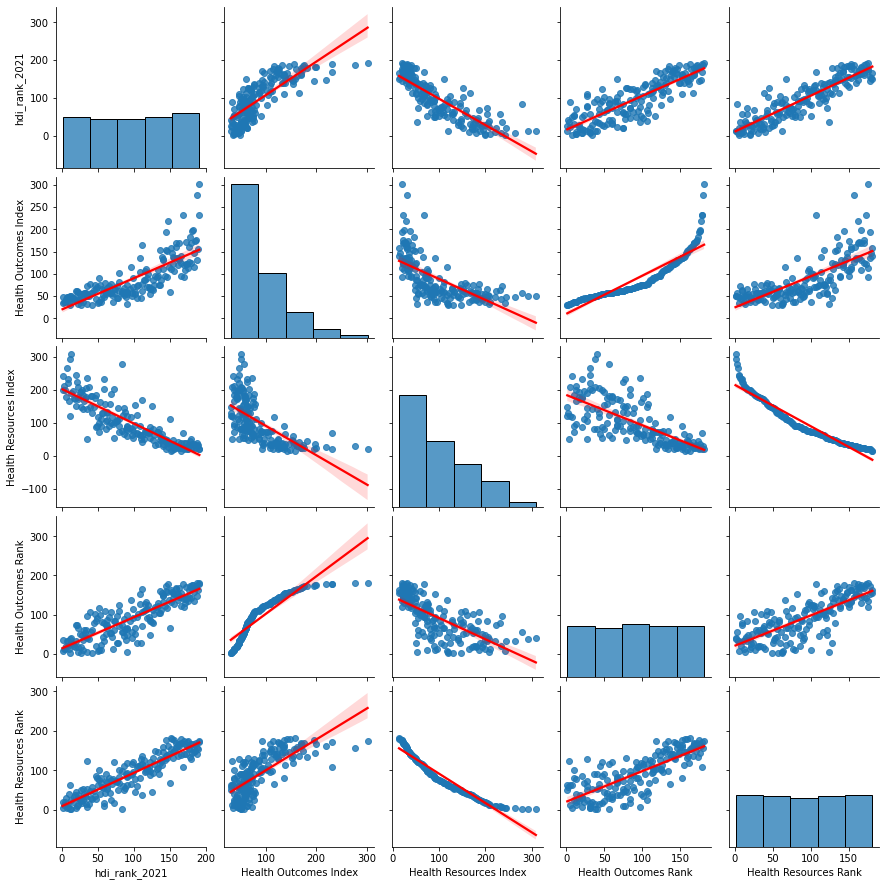

In [32]:
sns.pairplot(
    df[corr_cols],
    kind="reg",
    diag_kws={"bins": 5},
    plot_kws={"line_kws": {"color": "red"}},
)
plt.show()

##### Bargraphs
To visualize top 25 countries by Outcomes and by Resources - by region, HDI code

In [33]:
def create_composite_index_top_vis(df, column, color_col):

    rect = (
        alt.Chart(df)
        .mark_rect()
        .encode(
            x=alt.X(column),
            y=alt.Y("country", sort="x"),
            color=alt.Color(color_col, sort="x", scale=alt.Scale(scheme="greenblue")),
            tooltip=[
                "country",
                "Health Outcomes Rank",
                "Health Resources Rank",
                "Region Name",
                "HDI code",
            ],
        )
        .properties(
            height=250,
            width=400,
            title="Top 25 Countries by " + column + " and " + color_col + " (2021)",
        )
        .configure_axis(labelFontSize=10, titleFontSize=12)
    )
    return rect

In [34]:
# Visualizations for top 25 Countries by Composite Health Outcomes Rank and HDI code/Region Name/Health Resources Category
outcomes_hdi_vis = create_composite_index_top_vis(
    df.head(25), "Health Outcomes Rank", "HDI code"
)
outcomes_region_vis = create_composite_index_top_vis(
    df.head(25), "Health Outcomes Rank", "Region Name"
)
outcomes_resources_vis = create_composite_index_top_vis(
    df.head(25), "Health Outcomes Rank", "Health Resources Category"
)

# Visualizations for top 25 Countries by Composite Health Resources Rank and HDI code/Region Name/Health Outcomes Category
data = df.sort_values(by=["Health Resources Rank", "country"])
resources_hdi_vis = create_composite_index_top_vis(
    data.head(25), "Health Resources Rank", "HDI code"
)
resources_region_vis = create_composite_index_top_vis(
    data.head(25), "Health Resources Rank", "Region Name"
)
resources_outcomes_vis = create_composite_index_top_vis(
    data.head(25), "Health Resources Rank", "Health Outcomes Category"
)

Visualize top 25 Countries by Health Outcome Rank - and HDI code/Region/Health Resource Rank

In [35]:
outcomes_hdi_vis

alt.Chart(...)

In [36]:
outcomes_region_vis

alt.Chart(...)

In [37]:
outcomes_resources_vis

alt.Chart(...)

In [38]:
# create_composite_distribution_vis(df.head(25), 'Health Outcomes Rank', 'HDI code', 'Top 25 Countries by Health Outcomes Rank \n and HDI code(2021)'),
# create_composite_distribution_vis(df.head(25), 'Health Outcomes Rank', 'Region Name', 'Top 25 Countries by Health Outcomes Rank \n and Region(2021)'),
# create_composite_distribution_vis(df.head(25), 'Health Outcomes Rank', 'Health Resources Category', 'Top 25 Countries by Health Outcomes Rank \n and Health Resources Category(2021)')

Insights:
- Top 7 countries are all in Asia and they are allocating Medium Healthcare Resources (except Israel no.4: allocating High Resources and Bahrain no 5: allocating Low resources)
- Looks like Bahrain is alloting the least health resources among these 25 countries,  but is in the top 5 countries with regards to health outcomes. Bahrain could be the most efficient country with regards to utlizing healthcare resources
- Top 3 countries by Health Outcomes are only alloting Medium resources but getting Best outcomes

- There is no African country represented in the top 25 countries by Health Outcomes
- There are no Medium or Low HDI countries represented in Top 25 High Outcomes Country

Visualize top 25 Countries by Health Resources Rank - and HDI code/Region/Health Outcomes Rank

In [39]:
resources_hdi_vis

alt.Chart(...)

In [40]:
resources_region_vis

alt.Chart(...)

In [41]:
resources_outcomes_vis

alt.Chart(...)

Insights:
- Only 1 African country (Seychelles) and 2 Asian countries (JApan and Israel) are represented in the top 25 countries by Healthcare Resources
 - All countries in top 25 by Healthcare Resource Rank i.e. those alloting most resources to healthcare are in the very high HDI group (except Cuba and Seychelles- High HDI group). There are no countries in these top 25 from the Medium or Low HDI group. Therefore only the developed countries are represented in this group
 - 5 countries from these 25  are in the first (highest) quartile in of Healthcare Resources Rank, but in the second quartile(2nd best  or 'Good' category)  of Healthcare Outcomes Rank. These countries are Cuba, Uruguay, USA, Seychelles
 - 2 countries (Lithuania and Bulgaria) are in the third quartile(3rd best  or 'Fair' category)  of Healthcare Outcomes Rank.
 - The above 7 countries might not be efficient in their use of healthcare resources
 - All other countries represented here are in the first/best quartile for both healthcare resources and healthcare outcomes, suggesting that they are alloting the most healthcare resources and are also showing the best healthcare outcomes

##### Scatterplot
Visualize linear relationship between Health Resources and Health Outcomes in all countries for the year 2021

In [42]:
alt.Chart(df).mark_circle(point=True).encode(
    y=alt.Y("Health Outcomes Rank", title="Health Outcomes Rank 2021"),
    x=alt.X("Health Resources Rank", title="Health Resources Rank 2021"),
    # color = alt.Color('HDI code', sort = (['Very High', 'High', 'Medium', 'Low'])),
    color=alt.Color("Region Name", scale=alt.Scale(scheme="greenblue")),
    # size = alt.Size('Average GDP per capita'),
    tooltip=["country"],
).properties(
    height=200,
    width=300,
    title="Health Outcomes Rank and Health Resource Rank for each Country (2021)",
)

alt.Chart(...)

Insights

There appears to be a linear relationship between the two variables for all countries. 

Now, we can try to visualize the same relationship in different world regions to see which region has a stronger relationship

Create Visualization to see relationship between the two variables (resources and outcomes) among country subgroups like resource and outcome rank tiers/regions/HDicodes.

In [43]:
alt.Chart(df).mark_circle(point=True).encode(
    y=alt.Y("Health Outcomes Rank", title="Health Outcomes Rank 2021"),
    x=alt.X("Health Resources Rank", title="Health Resources Rank 2021"),
    color=alt.Color(
        "HDI code",
        sort=(["Very High", "High", "Medium", "Low"]),
        scale=alt.Scale(scheme="greenblue"),
    ),
    # color = alt.Color('Region Name'),
    tooltip=["country", "Region Name"],
).properties(
    height=200,
    width=400,
    title="Relationship Between the Health Outcomes Rank and Health Resource Rank for each Country (2021)",
).facet(
    "Region Name:N", columns=2
)

alt.FacetChart(...)

##### Stacked Barchart 
to Visualize change in composite index over the years in different regions of the world

If global Health Resources were pooled, what percentage of resources can be attributed to each region of the world

In [44]:
df_allyears.head()


def df_region_percs(variable):
    df_region_perc = (
        df_allyears.groupby(["year", "Region Name"])[variable].mean().reset_index()
    )
    df_region_perc["percentage"] = df_region_perc.groupby("year", group_keys=False)[
        variable
    ].transform(lambda x: x / x.sum() * 100)
    df_region_perc = df_region_perc.round().drop(variable, axis=1)
    return df_region_perc
    # .drop(
    #     'Refugee population by country or territory of asylum', axis=1)

In [45]:
df_region_resources_perc = df_region_percs("Health Resources Index")
df_region_outcomes_perc = df_region_percs("Health Outcomes Index")
df_region_resources_perc.head()

,year,Region Name,percentage
0,2000,Africa,8.0
1,2000,Americas,22.0
2,2000,Asia,18.0
3,2000,Europe,36.0
4,2000,Oceania,16.0


In [46]:
def create_stackedbar_incomegp_perc(df, chart_title):

    fig = px.bar(
        df,
        x="year",
        y="percentage",
        color="Region Name",
        hover_data=["percentage"],
        barmode="stack",
        title=chart_title,
        width=1000,
        height=500,
    )
    return fig.show()

In [47]:
create_stackedbar_incomegp_perc(
    df_region_resources_perc,
    "Percent of Health Resources, by Region (yearly 2000 - 2020)",
)

In [48]:
create_stackedbar_incomegp_perc(
    df_region_outcomes_perc,
    "Percent of Health Outcomes, by Region (yearly 2000 - 2020)",
)

##### Linecharts (timeseries)
yearly Health Outcomes and Heaalth Resources by region

In [49]:
df_region_aggregated = mean_resources_outcomes(
    df_select,
    ["Health Outcomes Index", "Health Resources Index"],
    ["Region Name", "year"],
    0,
)
df_region_aggregated.head(2)

,Region Name,year,Health Outcomes Index,Health Resources Index
85,Europe,2019,56.0,180.0
87,Europe,2021,56.0,181.0


In [50]:
def create_yearly_regional_index_vis(df, column):
    yearly_regional_index = (
        alt.Chart(df_region_aggregated)
        .mark_line(strokeWidth=5)
        .encode(
            x=alt.X("year:O"),
            y=alt.Y(column),
            color=alt.Color(
                "Region Name",
                legend=alt.Legend(symbolSize=200, symbolStrokeWidth=5),
                scale=alt.Scale(scheme="greenblue"),
            ),
            tooltip="Region Name",
        )
        .properties(title="Yearly Regional " + column)
    )
    return yearly_regional_index


yearly_region_outcomes = create_yearly_regional_index_vis(
    df_region_aggregated, "Health Outcomes Index"
)
yearly_region_resources = create_yearly_regional_index_vis(
    df_region_aggregated, "Health Resources Index"
)
yearly_region_outcomes | yearly_region_resources

alt.HConcatChart(...)

##### Barcharts
Identify top 5 countries based on:
- Best Health Outcomes (Health Outcomes Rank)
- Highest Health Resources (Health Resources Rank)

In [51]:
def top_countries_df(df, top_n):
    return df["country"].unique()[:top_n]


top_outcomes_countries = top_countries_df(df, 7)
top_resources_countries = top_countries_df(
    df.sort_values(by=["Health Resources Rank", "country"], ascending=True), 7
)

top_outcomes_all_years = df_allyears[
    df_allyears["country"].isin(top_outcomes_countries)
]
top_resources_all_years = df_allyears[
    df_allyears["country"].isin(top_resources_countries)
]

In [52]:
def create_top_countries_vis(df, column):
    vis = (
        alt.Chart(df)
        .mark_rect()
        .encode(
            y=alt.Y("country", sort=alt.Sort("x")),
            x=alt.X(column),
            color=alt.Color(
                "country", legend=None, scale=alt.Scale(scheme="greenblue")
            ),
        )
        .properties(title="Top 7 Countries by " + column)
    )
    return vis


create_top_countries_vis(
    top_outcomes_all_years, "Health Outcomes Rank"
) & create_top_countries_vis(top_resources_all_years, "Health Resources Rank")

alt.VConcatChart(...)

In [53]:
df.head(50)

,country,code,year,HDI code,Region Name,hdi_rank_2021,Health Outcomes Index,Health Resources Index,Health Resources Category,Health Outcomes Category,Health Outcomes Rank,Health Resources Rank,Efficiency,Efficiency Rank
3211,Singapore,SGP,2021,Very High,Asia,12.0,30.0,120.0,Medium,Best,1.5,62.5,61.0,9.5
3761,United Arab Emirates,ARE,2021,Very High,Asia,26.0,30.0,146.0,Medium,Best,1.5,49.0,47.5,19.0
2925,Qatar,QAT,2021,Very High,Asia,42.0,31.0,129.0,Medium,Best,3.0,57.0,54.0,15.0
263,Bahrain,BHR,2021,Very High,Asia,35.0,32.0,51.0,Low,Best,4.0,124.0,120.0,1.0
1759,Israel,ISR,2021,Very High,Asia,22.0,33.0,208.0,High,Best,5.5,13.0,7.5,74.0
2243,Maldives,MDV,2021,High,Asia,90.0,33.0,120.0,Medium,Best,5.5,62.5,57.0,12.0
1957,Kuwait,KWT,2021,Very High,Asia,50.0,34.0,117.0,Medium,Best,7.5,64.0,56.5,13.5
2705,Norway,NOR,2021,Very High,Europe,2.0,34.0,242.0,High,Best,7.5,6.0,-1.5,90.5
527,Brunei Darussalam,BRN,2021,Very High,Asia,51.0,36.0,73.0,Low,Best,10.0,100.5,90.5,3.0
1781,Italy,ITA,2021,Very High,Europe,30.0,36.0,185.0,High,Best,10.0,26.0,16.0,52.5


##### Linecharts (timeseries)
top 5 countires- yearly Health Resources and Health Outcomes
It appears that the top 5 countries allocating the most amount of resources for health are not among the top 5 countries with best outcomes

In [54]:
def create_yearly_index_vis(df, column):
    yearly_regional_index = (
        alt.Chart(df)
        .mark_line(strokeWidth=2)
        .encode(
            x=alt.X("year:O"),
            y=alt.Y(
                column, scale=alt.Scale(domain=[df[column].min(), df[column].max()])
            ),
            color=alt.Color(
                "country", legend=alt.Legend(symbolSize=200, symbolStrokeWidth=3)
            ),
            tooltip="country",
        )
        .properties(title="Yearly " + column)
    )
    return yearly_regional_index

How have the Health Outcomes Index and Health Resources Index changed over time for the current top 5 countries with best health outcomes

In [55]:
top_outcomes_countries_timeseries_vis = (
    (
        create_yearly_index_vis(top_outcomes_all_years, "Health Outcomes Index")
        | create_yearly_index_vis(top_outcomes_all_years, "Health Resources Index")
    )
    .properties(title="Top 5 Countries with Best Health Outcomes")
    .configure_axis(labelFontSize=10, titleFontSize=12)
    .configure_title(fontSize=14, anchor="middle")
)

top_outcomes_countries_timeseries_vis

alt.HConcatChart(...)

How have the Health Outcomes Index and Health Resources Index changed over time for the current top 5 countries allocating the most health resources

In [56]:
top_resources_countries_timeseries_vis = (
    (
        create_yearly_index_vis(top_resources_all_years, "Health Outcomes Index")
        | create_yearly_index_vis(top_resources_all_years, "Health Resources Index")
    )
    .properties(title="Top 5 Countries with Most Health Resources")
    .configure_axis(labelFontSize=10, titleFontSize=12)
    .configure_title(fontSize=14, anchor="middle")
)
top_resources_countries_timeseries_vis

alt.HConcatChart(...)

##### Composite Index - heatmap
Composite index variables by country

Idea for following visualizations came from :


Lim, S. S., Allen, K., Bhutta, Z. A., Dandona, L., Forouzanfar, M. H., Fullman, N., Gething, P. W., Goldberg, E. M., Hay, S. I., Holmberg, M., Kinfu, Y., Kutz, M. J., Larson, H. J., Liang, X., Lopez, A. D., Lozano, R., McNellan, C. R., Mokdad, A. H., Mooney, M. D., … Murray, C. J. (2016). Measuring the health-related sustainable development goals in 188 countries: A baseline analysis from the global burden of disease study 2015. The Lancet, 388(10053), 1813–1850. https://doi.org/10.1016/s0140-6736(16)31467-2 

In [57]:
def create_heatmap_top(df, df2, xvar, rankvar, title, num):
    ind_meas_mean = df[df["year"] == 2021]
    ind_meas_mean = ind_meas_mean.merge(df2, how="inner", on="country")
    hm = (
        ind_meas_mean.pivot(index=["country", rankvar], columns="variable", values=xvar)
        .reset_index()
        .set_index("country")
        .sort_values(by=rankvar, ascending=True)
        .head(num)
    )
    ax = sns.heatmap(
        hm,
        vmax=250,
        annot=True,
        fmt=".0f",
        cmap="crest",
        linewidths=2,
        linecolor="black",
    ).set(title=title)
    plt.xlabel("Indicator")
    plt.ylabel("Country")
    return ax


def create_heatmap_bottom(df, df2, xvar, rankvar, title, num):
    ind_meas_mean = df[df["year"] == 2021]
    ind_meas_mean = ind_meas_mean.merge(df2, how="inner", on="country")
    hm = (
        ind_meas_mean.pivot(index=["country", rankvar], columns="variable", values=xvar)
        .reset_index()
        .set_index("country")
        .sort_values(by=rankvar, ascending=True)
        .tail(num)
    )
    ax = sns.heatmap(
        hm,
        vmax=250,
        annot=True,
        fmt=".0f",
        cmap="crest",
        linewidths=2,
        linecolor="black",
    ).set(title=title)
    plt.xlabel("Indicator")
    plt.ylabel("Country")
    return ax


def create_heatmap(df, df2, xvar, rankvar, title):
    ind_meas_mean = df[df["year"] == 2021]
    ind_meas_mean = ind_meas_mean.merge(df2, how="inner", on="country")
    hm = (
        ind_meas_mean.pivot(index=["country", rankvar], columns="variable", values=xvar)
        .reset_index()
        .set_index("country")
        .sort_values(by=rankvar, ascending=True)
    )
    ax = sns.heatmap(
        hm,
        vmax=250,
        annot=True,
        fmt=".0f",
        cmap="crest",
        linewidths=2,
        linecolor="black",
    ).set(title=title)
    plt.xlabel("Indicator")
    plt.ylabel("Country")
    return ax

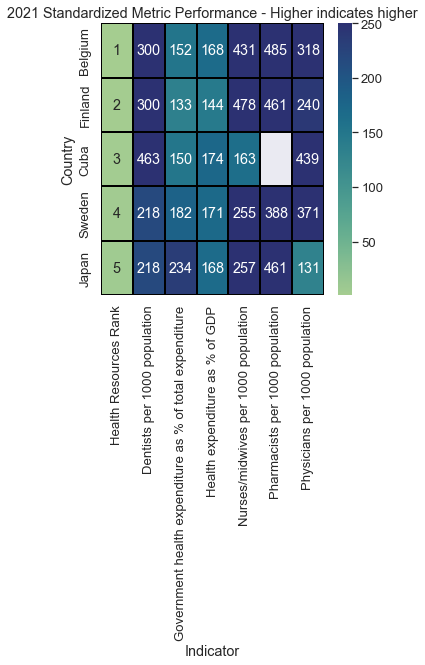

In [58]:
sns.set(font_scale=1.2)
plt.figure(figsize=(5, 5))
create_heatmap_top(
    long_all_exp,
    df[["country", "Health Resources Rank"]],
    xvar="year_dist_mean_exp",
    rankvar="Health Resources Rank",
    title="2021 Standardized Metric Performance - Higher indicates higher",
    num=5,
)
plt.show()

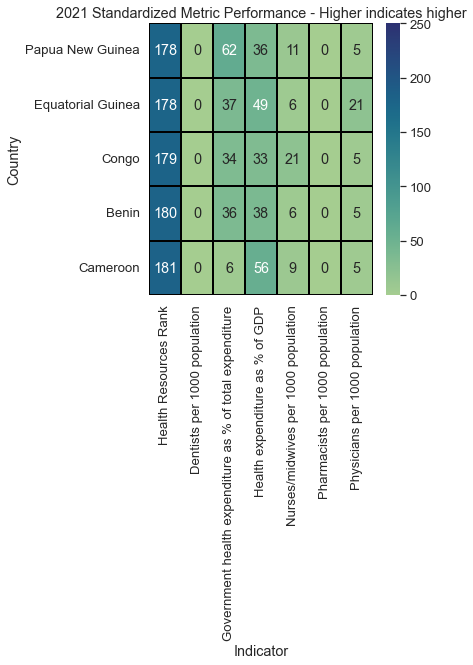

In [59]:
sns.set(font_scale=1.2)
plt.figure(figsize=(5, 5))
create_heatmap_bottom(
    long_all_exp,
    df[["country", "Health Resources Rank"]],
    xvar="year_dist_mean_exp",
    rankvar="Health Resources Rank",
    title="2021 Standardized Metric Performance - Higher indicates higher",
    num=5,
)
plt.show()

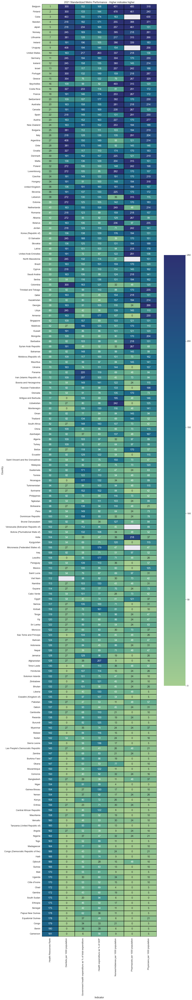

In [60]:
sns.set(font_scale=1.2)
plt.figure(figsize=(15, 100))
create_heatmap(
    long_all_exp,
    df[["country", "Health Resources Rank"]],
    xvar="year_dist_mean_exp",
    rankvar="Health Resources Rank",
    title="2021 Standardized Metric Performance - Higher indicates higher",
)
plt.show()

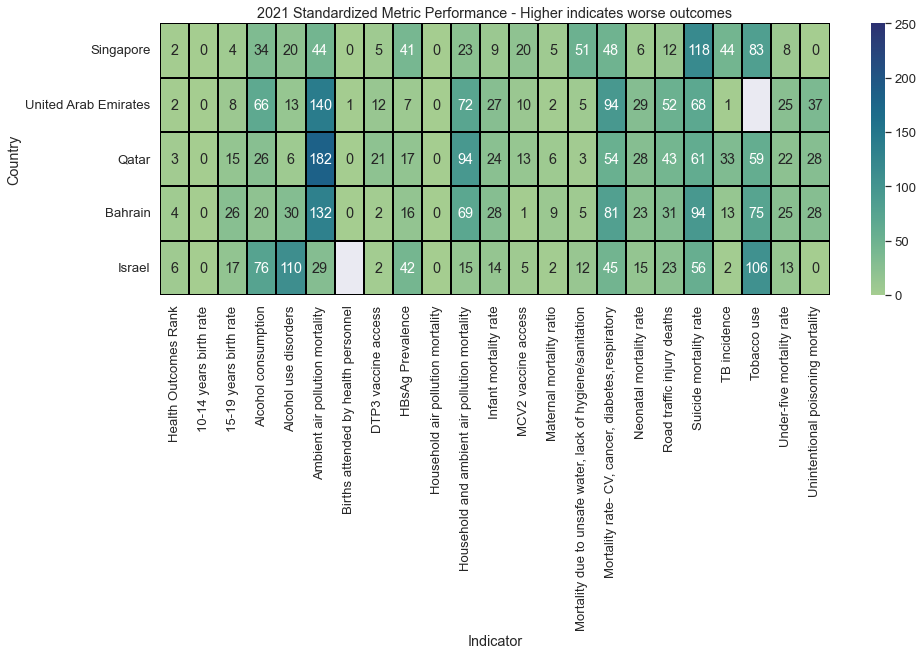

In [61]:
sns.set(font_scale=1.2)
plt.figure(figsize=(15, 5))
create_heatmap_top(
    long_all_health,
    df[["country", "Health Outcomes Rank"]],
    xvar="year_dist_mean",
    rankvar="Health Outcomes Rank",
    title="2021 Standardized Metric Performance - Higher indicates worse outcomes",
    num=5,
)
plt.show()

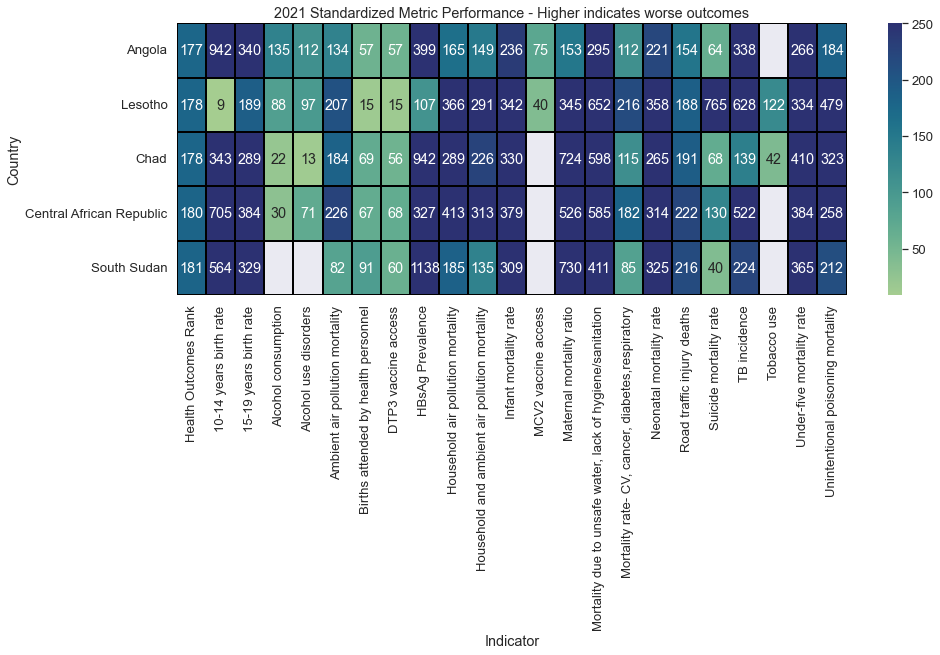

In [62]:
sns.set(font_scale=1.2)
plt.figure(figsize=(15, 5))
create_heatmap_bottom(
    long_all_health,
    df[["country", "Health Outcomes Rank"]],
    xvar="year_dist_mean",
    rankvar="Health Outcomes Rank",
    title="2021 Standardized Metric Performance - Higher indicates worse outcomes",
    num=5,
)
plt.show()

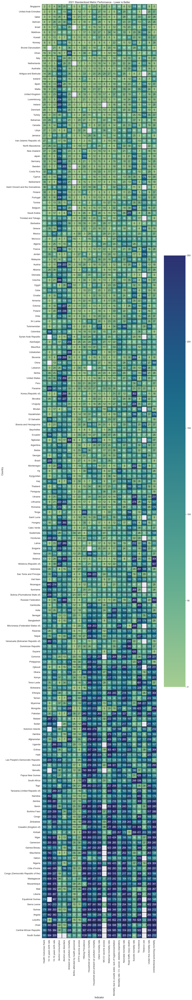

In [63]:
sns.set(font_scale=1.2)
plt.figure(figsize=(15, 100))
create_heatmap(
    long_all_health,
    df[["country", "Health Outcomes Rank"]],
    xvar="year_dist_mean",
    rankvar="Health Outcomes Rank",
    title="2021 Standardized Metric Performance - Lower is Better",
)
plt.show()

Limitations:

- dropping countries with incomplete/missing data might lead us to drop a certain group or category. Not representing this group could introduce selection bias in our analysis

#### ANOVA

We'd like to know it the country groups (grouped by `hdicode` or `Region Name`) perform differently in the health resources (`year_dist_mean_exp`) and health outcomes index(`year_dist_mean`).<br>
We will conduct the one-way ANOVA hypothesis test for `hdicode` and `Region Name` if they pass the assumptions.<br>

<u>Assumptions for the one-way ANOVA hypothesis test:</u><br>

1. Sample data are randomly selected from populations and randomly assigned to each of the treatment groups. Each observation is thus independent of any other observation — randomness and independence.
    - We assumed that the data we collected from are trustable for randomness and independence.
2. Homogeneity of variance. All the c group variances are equal. As a rule of thumb, if the ratio of the largest to the smallest sample standard deviation is less than 2, we consider the equal standard deviations assumption as fulfilled.
    - We will calculate for each group `hdicode` and `Region Name`
3. Normality. Values in each sampled groups are assumed to be drawn from normally distributed populations. We can use normal probability plot or Q-Q plot to check normality.
    - We will plot the group if it passes the Homogeneity of variance


F test for differences in more than two means

H₀: μ₁= μ₂ = μ₃ = … = μ𝒸

H₁: Not all μᵢ’s are equal, where i = 1, 2, 3, …, c.

Level of significance = α (will be used 0.05)

Decision Rule: Reject H₀ when F > F Critical Value OR p value < α

In [64]:
# Load the file and columns that we need
cols_to_use = [
    "country",
    "hdicode",
    "Region Name",
    "year_dist_mean",
    "year_dist_mean_exp",
]
df_anova = pd.read_csv("../src/data/wide_all.csv", usecols=cols_to_use)[cols_to_use]
df_anova.head()

,country,hdicode,Region Name,year_dist_mean,year_dist_mean_exp
0,Afghanistan,Low,Asia,163.840000,41.538871
1,Afghanistan,Low,Asia,163.660000,38.717333
2,Afghanistan,Low,Asia,166.176667,38.717333
3,Afghanistan,Low,Asia,154.693333,38.675300
4,Afghanistan,Low,Asia,152.843333,38.667065


In [65]:
# Test for homogeneity of variance for the group 'hdicode'
ratio = (
    df_anova.groupby("hdicode").std().max() / df_anova.groupby("hdicode").std().min()
)
ratio

year_dist_mean        2.949302
year_dist_mean_exp    5.470924
dtype: float64

<b>Commentary:</b><br>
Ratios are pretty high which can not satisfy the homogeneity of variance for the group 'hdicode'

In [66]:
# Test for homogeneity of variance for the group 'hdicode'
ratio = (
    df_anova.groupby("Region Name").std().max()
    / df_anova.groupby("Region Name").std().min()
)
ratio

year_dist_mean        3.162774
year_dist_mean_exp    2.098593
dtype: float64

<b>Commentary:</b><br>
Ratio is high for year_dist_mean which can not satisfy the homogeneity of variance for the group 'Region Name'.<br>
Ratio is fairly good for year_dist_mean_exp which can go next step `Normality'.

In [67]:
df_anova_reg = (
    df_anova.groupby(["Region Name", "country"])["year_dist_mean_exp"]
    .mean()
    .reset_index()
)
df_anova_reg.head()

,Region Name,country,year_dist_mean_exp
0,Africa,Algeria,87.065131
1,Africa,Angola,27.767630
2,Africa,Benin,18.355676
3,Africa,Botswana,63.440864
4,Africa,Burkina Faso,30.207126


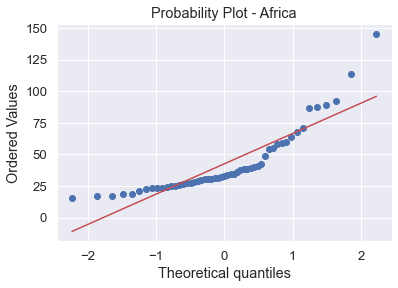

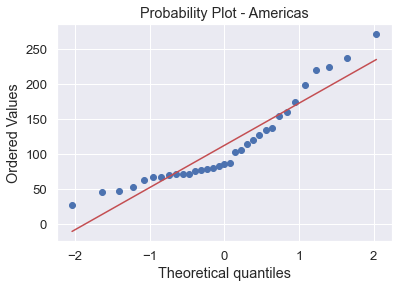

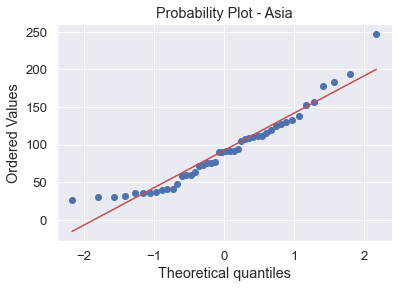

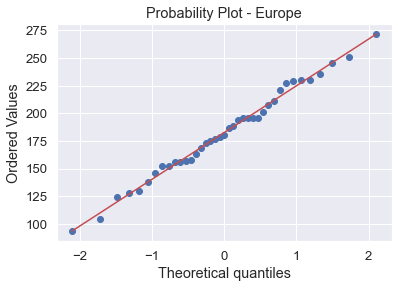

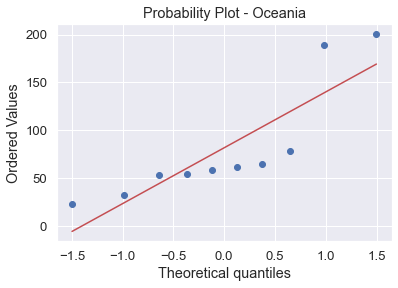

In [68]:
# Test for the normality with Q-Q plots
unique_region = df_anova_reg["Region Name"].unique()
for region in unique_region:
    stats.probplot(
        df_anova_reg[df_anova_reg["Region Name"] == region]["year_dist_mean_exp"],
        dist="norm",
        plot=plt,
    )
    plt.title("Probability Plot - " + region)
    plt.show()

<b>Commentary:</b><br>
The Q-Q plots show generally straight-line pattern if it is from a normal distribution. We may assume that the data for each group falls roughly on a straight line based on the Q-Q plots above.

In [69]:
# Let's see our country groups
df_anova_reg["Region Name"].unique()

array(['Africa', 'Americas', 'Asia', 'Europe', 'Oceania'], dtype=object)

In [70]:
# Create a list for each country group
list_Africa = list(
    df_anova_reg.loc[
        df_anova_reg["Region Name"] == "Africa", "year_dist_mean_exp"
    ].iloc[:]
)
list_Americas = list(
    df_anova_reg.loc[
        df_anova_reg["Region Name"] == "Americas", "year_dist_mean_exp"
    ].iloc[:]
)
list_Asia = list(
    df_anova_reg.loc[df_anova_reg["Region Name"] == "Asia", "year_dist_mean_exp"].iloc[
        :
    ]
)
list_Europe = list(
    df_anova_reg.loc[
        df_anova_reg["Region Name"] == "Europe", "year_dist_mean_exp"
    ].iloc[:]
)
list_Oceania = list(
    df_anova_reg.loc[
        df_anova_reg["Region Name"] == "Oceania", "year_dist_mean_exp"
    ].iloc[:]
)

In [71]:
# Apply one-way Anova to the country groups
f_oneway(list_Africa, list_Americas, list_Asia, list_Europe, list_Oceania)

F_onewayResult(statistic=53.97206028241593, pvalue=1.2625689153004143e-29)

In [72]:
# Let's calculate the F critical value
# dfn denotes number of degrees of freedom that the estimate of variance used in the numerator, dfn=a-1.
# dfd is the number of degrees of freedom that the estimate of variance used in the denominator, dfd=N-a.
# a (5) is the number of groups and N (183) is the total number of subjects.

scipy.stats.f.ppf(q=1 - 0.05, dfn=4, dfd=178)

2.4224104994116433

<b>Commentary:</b><br>
The F statistic and p-value turn out to be equal to 53.850 and 1.105e-29 respectively. Since F statistic significantly bigger than F critical value and the p-value is less than 0.05 hence we would reject the null hypothesis. This implies that we have sufficient proof to conclude that there exists a difference in the performance among five country groups.